# 用 PyTorch 写一个简单的扩散模型

实现一个简单扩散模型，拟合图片中点的分布。

示例代码使用下面的图片：

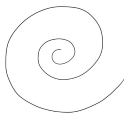

**代码参考：**
- YouTube [Diffusion models from scratch in PyTorch](https://www.youtube.com/watch?v=a4Yfz2FxXiY&list=PL2DNwKxO3dEz8xGvrNA8_HRXQLGDSxtKz&index=1)
- Colab [A Diffusion Model from Scratch in Pytorch](https://colab.research.google.com/drive/1sjy9odlSSy0RBVgMTgP7s99NXsqglsUL?usp=sharing#scrollTo=HhIgGq3za0yh)

# 准备训练数据
从图片中取出点的坐标位置，并且将坐标表示为 [-1, 1] 区间内的值

In [ ]:
from google.colab import drive
drive.mount('/content/drive') # 从Google Drive中读取图片

In [21]:
import torch
import matplotlib.pyplot as plt
from torchvision.io import read_image
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets

class PointDataset(Dataset):
  def __init__(self, file):
    image = read_image(file) # JPG 格式，3 x W x H 
    shape = image.shape
    assert shape[0] == 3
    assert shape[1] == shape[2]
    data = torch.where(image[0]> 128, False, True) # 黑色rgb(0, 0, 0) 白色rgb(255, 255, 255)
    data = torch.argwhere(data)
    self.data = 2*data/shape[1] - 1

  def __len__(self):
    return len(self.data)

  def __getitem__(self, idx):
    return self.data[None, idx]

In [22]:
BATCH_SIZE = 512
dataset = PointDataset('/content/drive/MyDrive/round.jpg')
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

In [23]:
#@title 测试 DataLoader
for batch_idx, samples in enumerate(dataloader):
  print(batch_idx, samples.shape)

0 torch.Size([512, 1, 2])
1 torch.Size([512, 1, 2])
2 torch.Size([512, 1, 2])
3 torch.Size([512, 1, 2])
4 torch.Size([512, 1, 2])
5 torch.Size([512, 1, 2])
6 torch.Size([512, 1, 2])


# 构建扩散模型 


## Step 1: 正向过程 = 添加噪声




We first need to build the inputs for our model, which are more and more noisy images. Instead of doing this sequentially, we can use the closed form provided in the papers to calculate the image for any of the timesteps individually. 

**Key Takeaways**:
- The noise-levels/variances can be pre-computed
- There are different types of variance schedules
- We can sample each timestep image independently (Sums of Gaussians is also Gaussian)
- No model is needed in this forward step

In [24]:
import torch.nn.functional as F

def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """ 
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, device="cpu"):
    """ 
    Takes an image and a timestep as input and 
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)


# Define beta schedule
T = 300
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

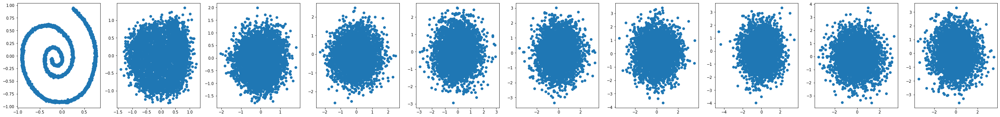

In [25]:
# Simulate forward diffusion
data = dataset.data

plt.figure(figsize=(50,5))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
  t = torch.Tensor([idx]).type(torch.int64)
  plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
  data, noise = forward_diffusion_sample(data, t)
  plt.scatter(data[:, 0], data[:, 1], cmap='hot')

## Step 2: The backward process = U-Net



For a great introduction to UNets, have a look at this post: https://amaarora.github.io/2020/09/13/unet.html.


**Key Takeaways**:
- We use a simple form of a UNet for to predict the noise in the image
- The input is a noisy image, the ouput the noise in the image
- Because the parameters are shared accross time, we need to tell the network in which timestep we are
- The Timestep is encoded by the transformer Sinusoidal Embedding
- We output one single value (mean), because the variance is fixed


In [26]:
from torch import nn
import math


class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv1d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose1d(out_ch, out_ch, 3, 1, 1)
        else:
            self.conv1 = nn.Conv1d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv1d(out_ch, out_ch, 3, 1, 1)
        self.conv2 = nn.Conv1d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm1d(out_ch)
        self.bnorm2 = nn.BatchNorm1d(out_ch)
        self.relu  = nn.ReLU()
        
    def forward(self, x, t, ):
        # First Conv
        h = self.bnorm1(self.relu(self.conv1(x)))
        # Time embedding
        time_emb = self.relu(self.time_mlp(t))
        # Extend last 2 dimensions
        time_emb = time_emb[(..., ) + (None, )]
        # Add time channel
        h = h + time_emb
        # Second Conv
        h = self.bnorm2(self.relu(self.conv2(h)))
        # Down or Upsample
        return self.transform(h)


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        # TODO: Double check the ordering here
        return embeddings


class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        down_channels = (64, 128, 256, 512)
        up_channels = (512, 256, 128, 64)
        out_dim = 1 
        time_emb_dim = 32

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )
        
        # Initial projection
        self.conv0 = nn.Conv1d(1, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        # Upsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])

        self.output = nn.Conv1d(up_channels[-1], 1, out_dim)

    def forward(self, x, timestep):
        # Embedd time
        t = self.time_mlp(timestep)
        # Initial conv
        x = self.conv0(x)
        # Unet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Add residual x as additional channels
            x = torch.cat((x, residual_x), dim=1)           
            x = up(x, t)
        return self.output(x)

model = SimpleUnet()
print("Num params: ", sum(p.numel() for p in model.parameters()))
model

Num params:  4183905


SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv1d(1, 64, kernel_size=(3,), stride=(1,), padding=(1,))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv1d(64, 128, kernel_size=(3,), stride=(1,), padding=(1,))
      (transform): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1,))
      (conv2): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1,))
      (bnorm1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv1d(128, 256, kernel_size=(3,), stride=(1,), padding=(1,))
      (transform): Conv1d(256, 256, kernel_si


**Further improvements that can be implemented:**
- Residual connections
- Different activation functions like SiLU, GWLU, ...
- BatchNormalization 
- GroupNormalization
- Attention
- ...

## Step 3: The loss



**Key Takeaways:**
- After some maths we end up with a very simple loss function
- There are other possible choices like L2 loss ect.


In [27]:
def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred)

## Sampling
- Without adding @torch.no_grad() we quickly run out of memory, because pytorch tacks all the previous images for gradient calculation 
- Because we pre-calculated the noise variances for the forward pass, we also have to use them when we sequentially perform the backward process

In [28]:
@torch.no_grad()
def sample_timestep(x, t):
    """
    Calls the model to predict the noise in the image and returns 
    the denoised image. 
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
    
    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)
    
    if t == 0:
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise 

@torch.no_grad()
def sample_plot_image():
    data = torch.randn([20*128, 1, 2], device=device)
    plt.figure(figsize=(50,5))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        data = sample_timestep(data, t)
        if i % stepsize == 0:
            plt.subplot(1, int(num_images), int(i/stepsize+1))
            plt.scatter(data[:,0, 0].detach().cpu(), data[:, 0, 1].detach().cpu(), cmap='hot')
    plt.show()            

## Training

Epoch 0 | step 000 Loss: 0.8294289112091064 


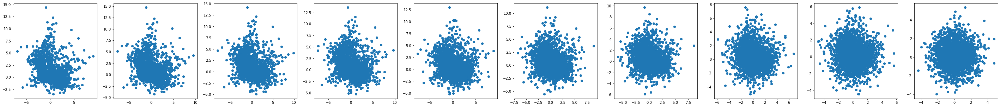

Epoch 300 | step 000 Loss: 0.35875096917152405 


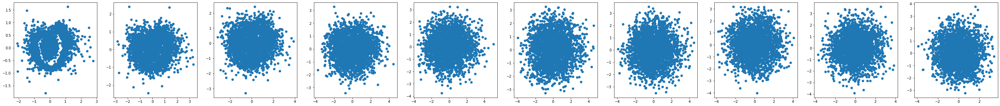

Epoch 600 | step 000 Loss: 0.3598751425743103 


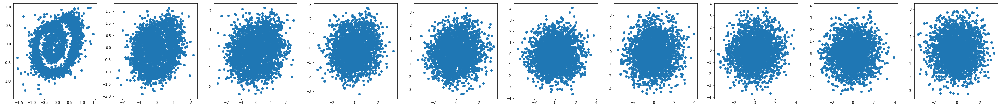

Epoch 900 | step 000 Loss: 0.38287806510925293 


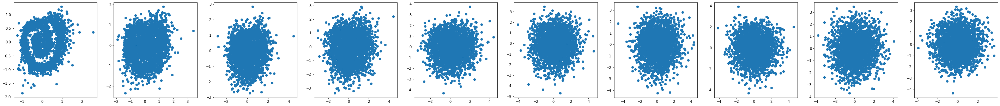

Epoch 1200 | step 000 Loss: 0.4002695083618164 


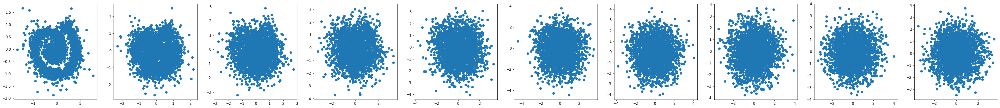

Epoch 1500 | step 000 Loss: 0.3635712265968323 


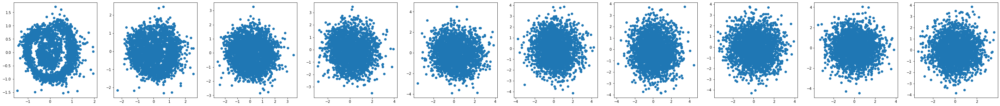

Epoch 1800 | step 000 Loss: 0.3651939630508423 


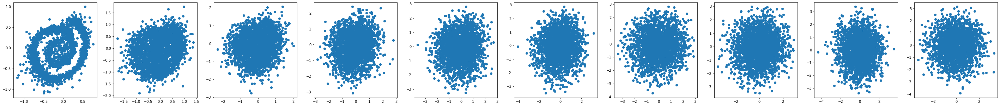

Epoch 2100 | step 000 Loss: 0.38668501377105713 


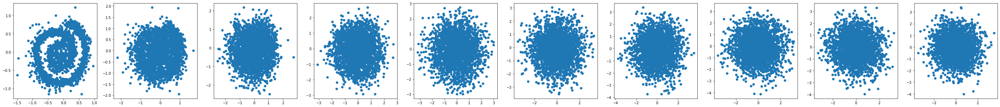

Epoch 2400 | step 000 Loss: 0.39179563522338867 


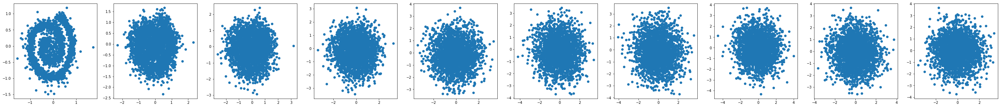

Epoch 2700 | step 000 Loss: 0.3589801788330078 


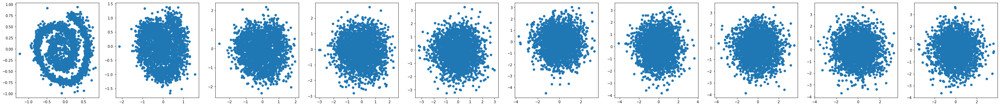

Epoch 3000 | step 000 Loss: 0.3569556772708893 


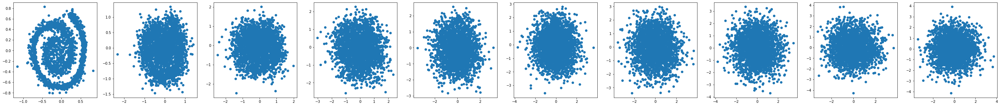

Epoch 3300 | step 000 Loss: 0.3634835183620453 


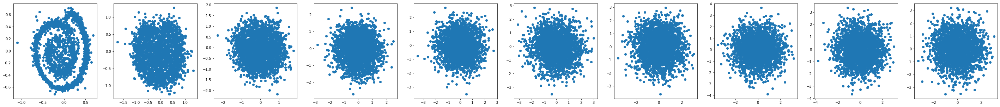

Epoch 3600 | step 000 Loss: 0.37339892983436584 


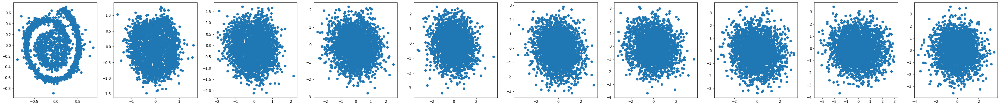

Epoch 3900 | step 000 Loss: 0.39786967635154724 


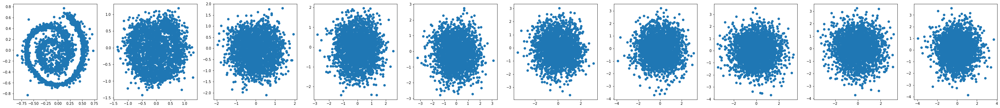

Epoch 4200 | step 000 Loss: 0.3629923462867737 


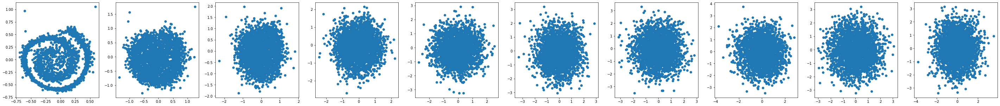

Epoch 4500 | step 000 Loss: 0.3597969710826874 


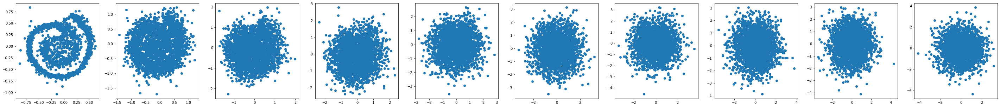

Epoch 4800 | step 000 Loss: 0.3521181344985962 


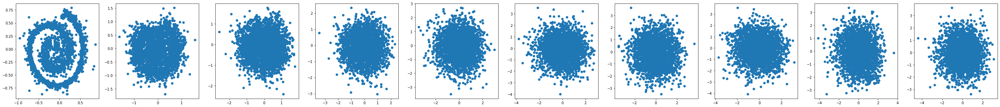

Epoch 5100 | step 000 Loss: 0.3945973515510559 


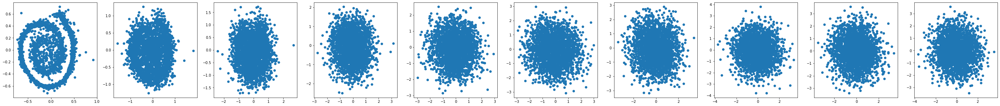

Epoch 5400 | step 000 Loss: 0.3682924211025238 


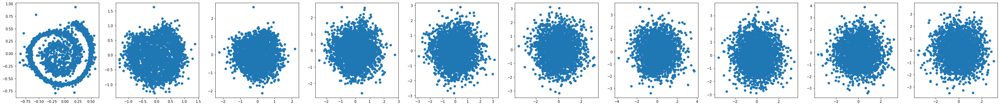

Epoch 5700 | step 000 Loss: 0.36682194471359253 


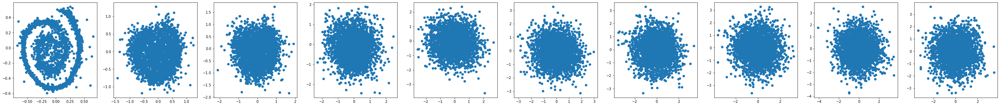

Epoch 6000 | step 000 Loss: 0.3579838275909424 


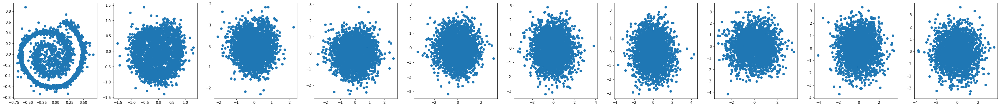

Epoch 6300 | step 000 Loss: 0.38477134704589844 


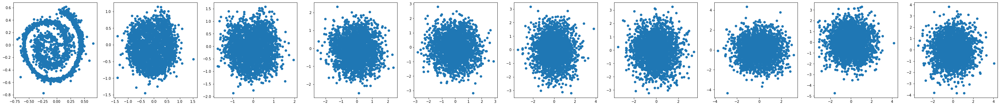

Epoch 6600 | step 000 Loss: 0.3568105101585388 


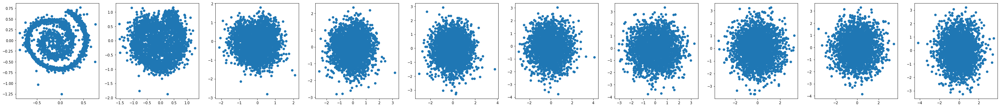

Epoch 6900 | step 000 Loss: 0.3583923578262329 


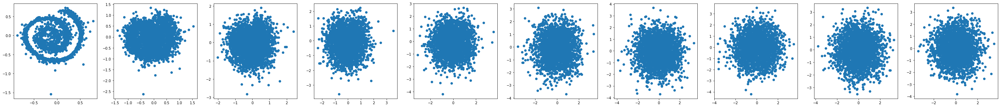

Epoch 7200 | step 000 Loss: 0.3483036756515503 


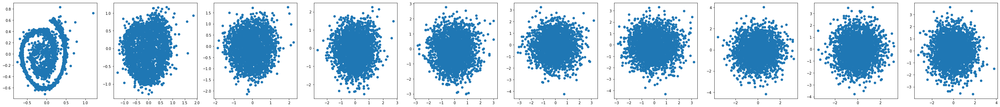

Epoch 7500 | step 000 Loss: 0.3675823211669922 


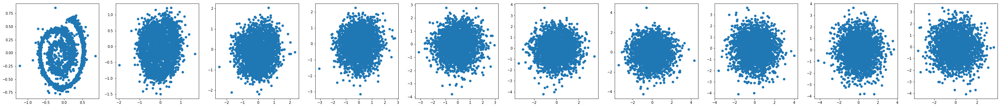

Epoch 7800 | step 000 Loss: 0.37263718247413635 


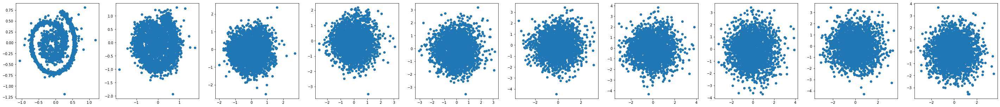

Epoch 8100 | step 000 Loss: 0.39286649227142334 


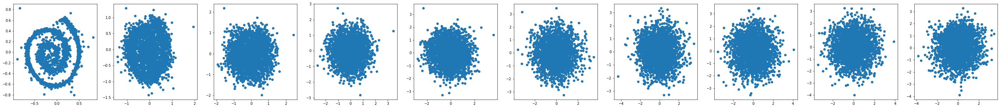

Epoch 8400 | step 000 Loss: 0.35533466935157776 


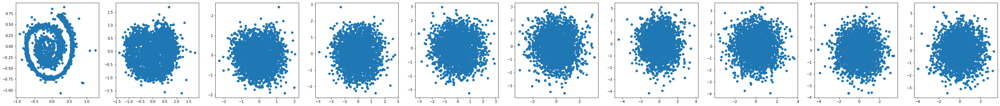

Epoch 8700 | step 000 Loss: 0.3788231313228607 


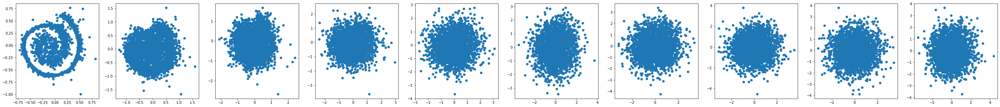

Epoch 9000 | step 000 Loss: 0.37808576226234436 


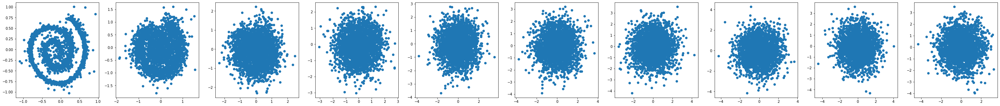

Epoch 9300 | step 000 Loss: 0.36387526988983154 


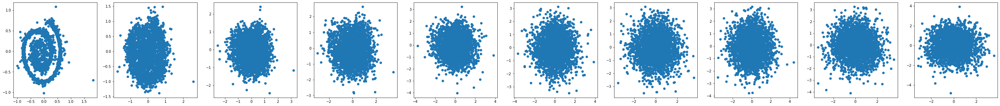

Epoch 9600 | step 000 Loss: 0.36901170015335083 


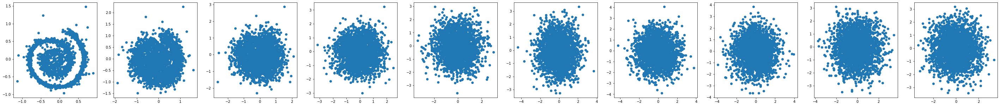

Epoch 9900 | step 000 Loss: 0.3886151909828186 


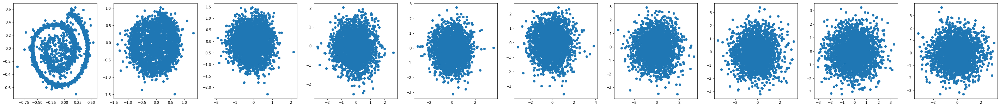

Epoch 10200 | step 000 Loss: 0.3483808636665344 


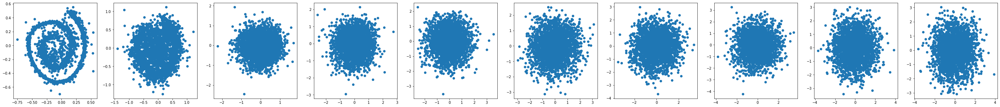

Epoch 10500 | step 000 Loss: 0.33947157859802246 


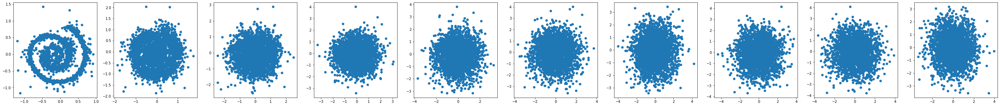

Epoch 10800 | step 000 Loss: 0.36137956380844116 


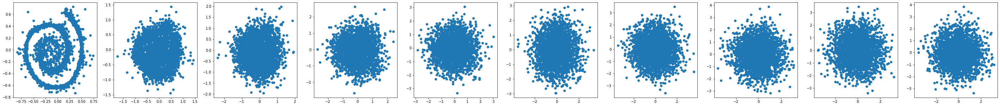

Epoch 11100 | step 000 Loss: 0.37126094102859497 


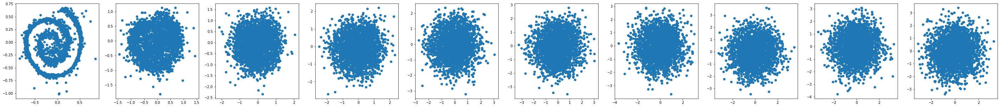

Epoch 11400 | step 000 Loss: 0.35022884607315063 


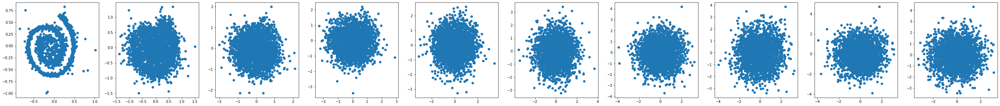

Epoch 11700 | step 000 Loss: 0.365925669670105 


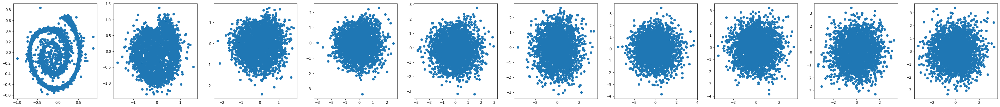

Epoch 12000 | step 000 Loss: 0.38569405674934387 


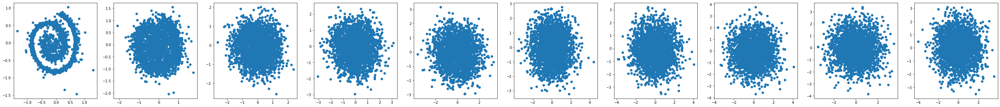

Epoch 12300 | step 000 Loss: 0.37971261143684387 


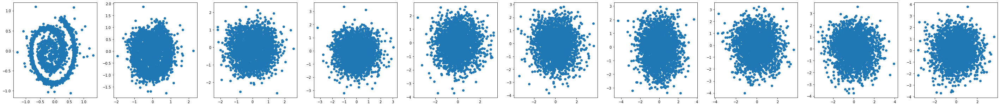

Epoch 12600 | step 000 Loss: 0.36180365085601807 


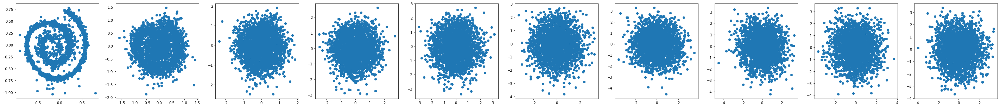

Epoch 12900 | step 000 Loss: 0.35781484842300415 


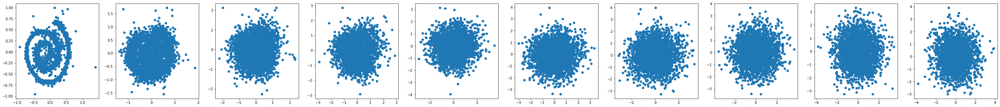

Epoch 13200 | step 000 Loss: 0.335693895816803 


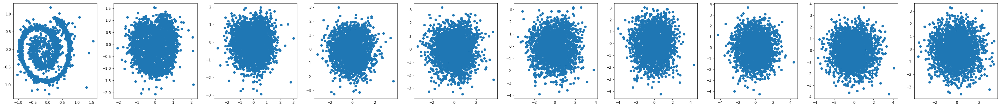

Epoch 13500 | step 000 Loss: 0.3785010576248169 


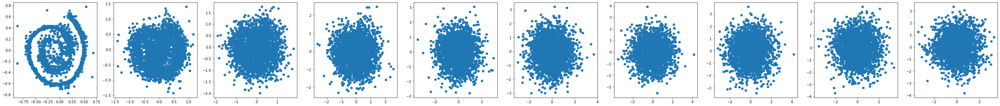

Epoch 13800 | step 000 Loss: 0.37489908933639526 


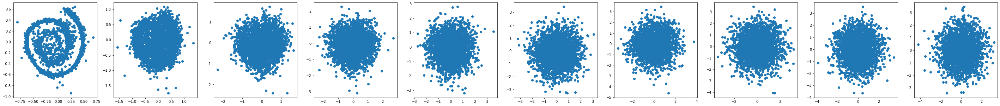

Epoch 14100 | step 000 Loss: 0.3552607297897339 


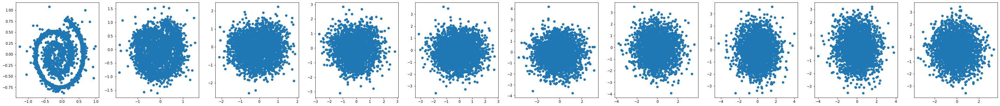

Epoch 14400 | step 000 Loss: 0.35423150658607483 


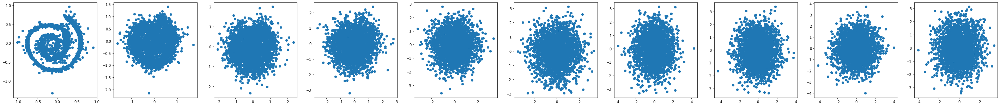

Epoch 14700 | step 000 Loss: 0.3726530969142914 


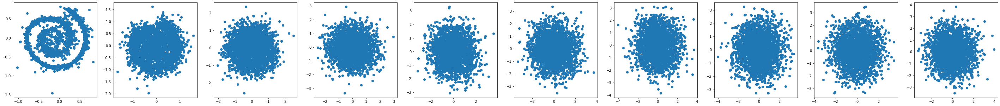

Epoch 15000 | step 000 Loss: 0.3530847430229187 


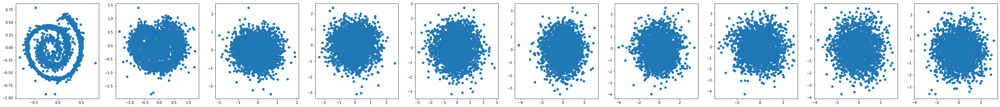

Epoch 15300 | step 000 Loss: 0.36150848865509033 


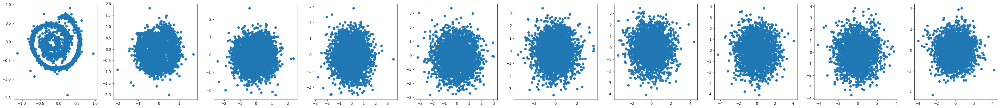

Epoch 15600 | step 000 Loss: 0.3391946852207184 


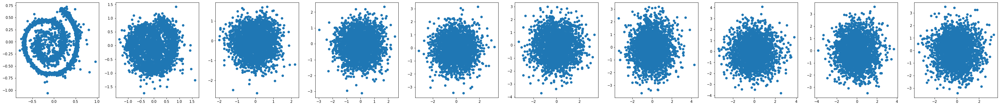

Epoch 15900 | step 000 Loss: 0.3425406515598297 


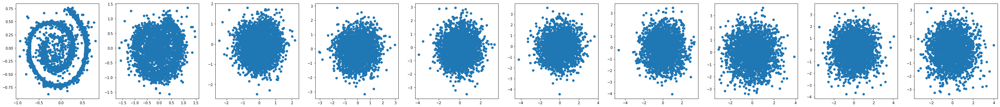

Epoch 16200 | step 000 Loss: 0.36086973547935486 


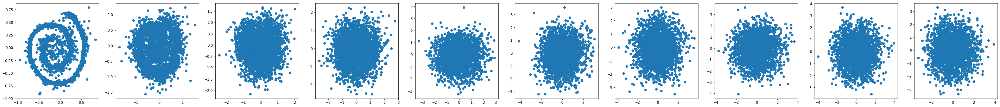

Epoch 16500 | step 000 Loss: 0.35260117053985596 


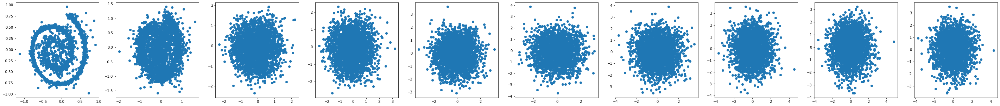

Epoch 16800 | step 000 Loss: 0.36982953548431396 


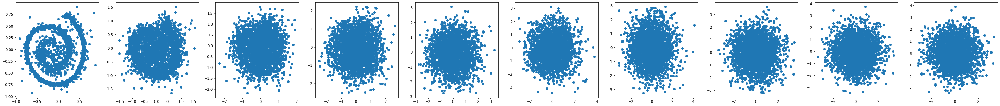

Epoch 17100 | step 000 Loss: 0.4053804874420166 


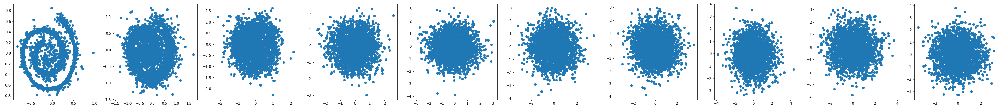

Epoch 17400 | step 000 Loss: 0.36070024967193604 


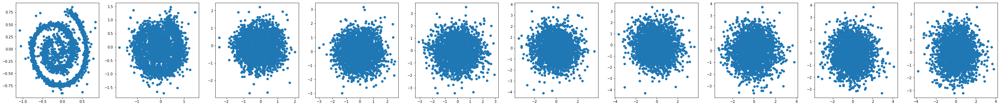

Epoch 17700 | step 000 Loss: 0.3853675425052643 


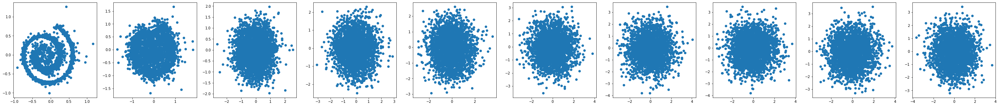

Epoch 18000 | step 000 Loss: 0.3697408139705658 


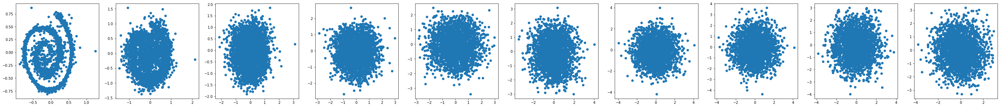

Epoch 18300 | step 000 Loss: 0.3644137978553772 


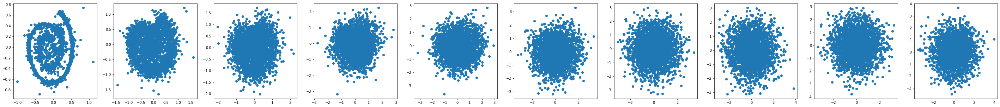

Epoch 18600 | step 000 Loss: 0.363707035779953 


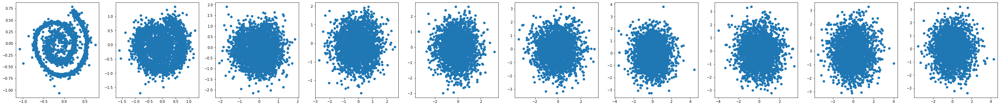

Epoch 18900 | step 000 Loss: 0.3816452920436859 


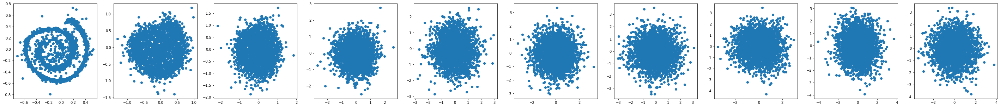

Epoch 19200 | step 000 Loss: 0.34469401836395264 


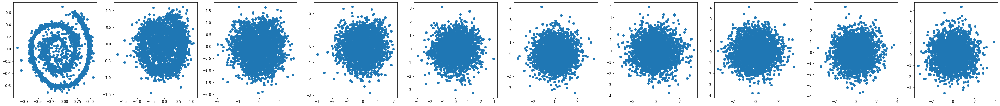

Epoch 19500 | step 000 Loss: 0.3780119717121124 


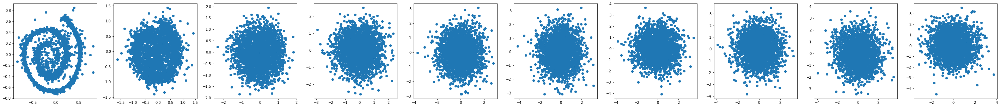

Epoch 19800 | step 000 Loss: 0.37533485889434814 


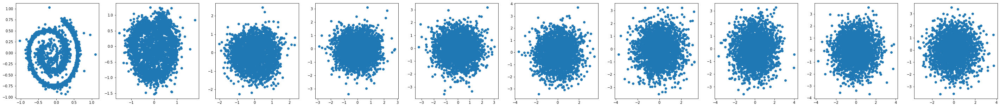

Epoch 20100 | step 000 Loss: 0.3491472601890564 


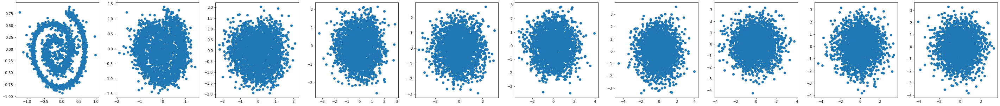

Epoch 20400 | step 000 Loss: 0.3575734794139862 


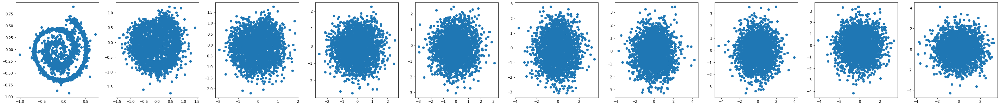

Epoch 20700 | step 000 Loss: 0.36048027873039246 


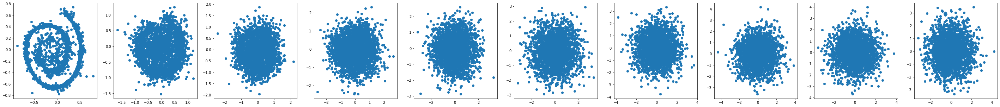

Epoch 21000 | step 000 Loss: 0.3652222752571106 


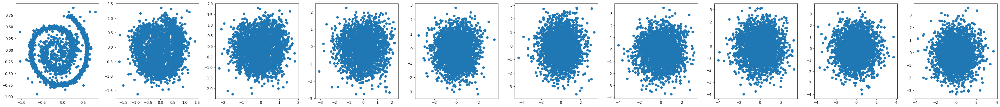

Epoch 21300 | step 000 Loss: 0.34757745265960693 


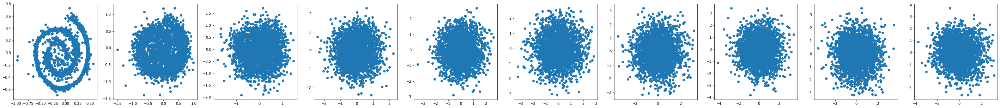

Epoch 21600 | step 000 Loss: 0.3832133412361145 


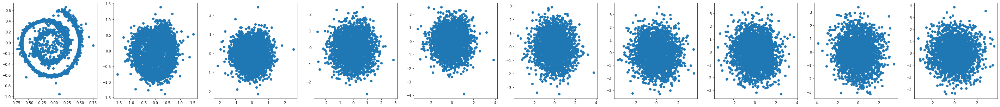

Epoch 21900 | step 000 Loss: 0.3989552855491638 


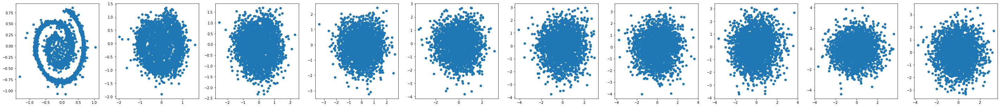

Epoch 22200 | step 000 Loss: 0.3603009581565857 


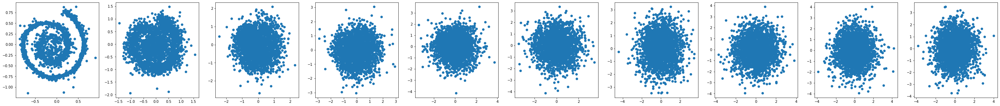

Epoch 22500 | step 000 Loss: 0.3595127463340759 


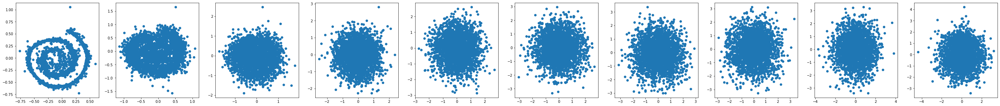

Epoch 22800 | step 000 Loss: 0.3641934394836426 


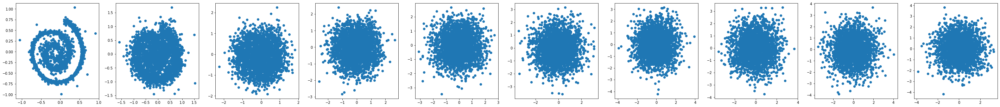

Epoch 23100 | step 000 Loss: 0.3535614609718323 


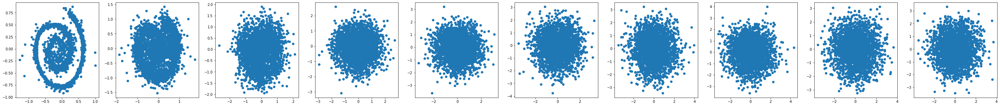

Epoch 23400 | step 000 Loss: 0.38200855255126953 


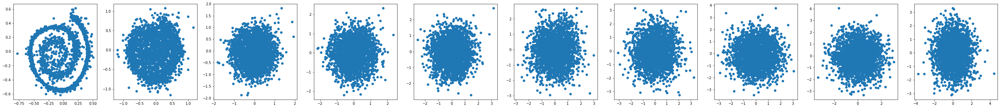

Epoch 23700 | step 000 Loss: 0.3643364906311035 


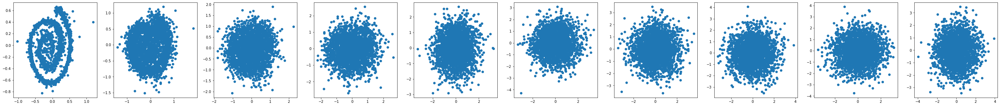

Epoch 24000 | step 000 Loss: 0.3624619245529175 


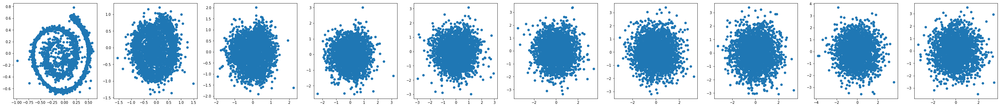

Epoch 24300 | step 000 Loss: 0.3519628942012787 


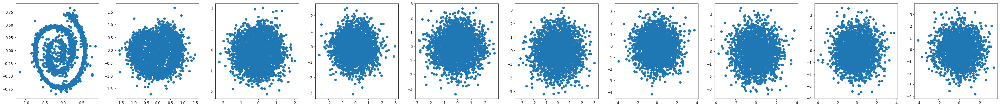

Epoch 24600 | step 000 Loss: 0.36267852783203125 


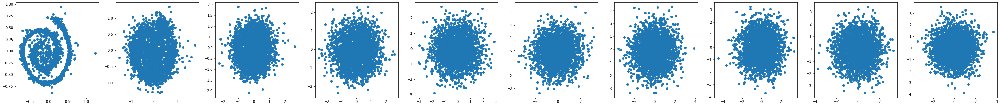

Epoch 24900 | step 000 Loss: 0.3486325144767761 


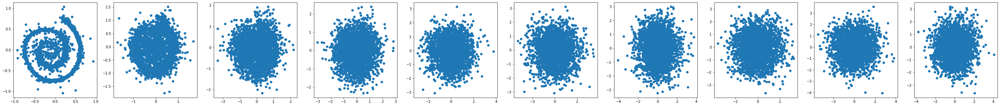

Epoch 25200 | step 000 Loss: 0.39043092727661133 


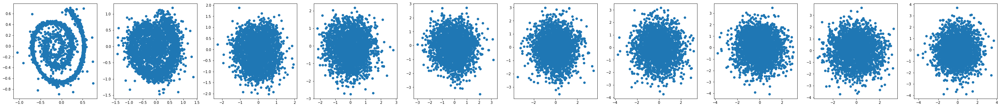

Epoch 25500 | step 000 Loss: 0.35819917917251587 


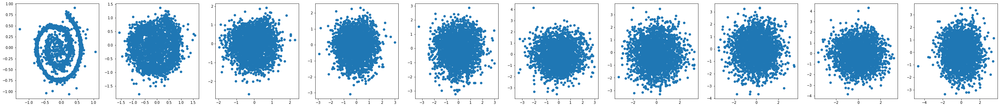

Epoch 25800 | step 000 Loss: 0.3760187029838562 


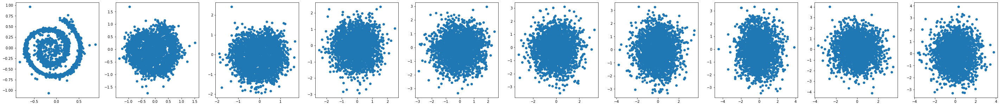

Epoch 26100 | step 000 Loss: 0.3636385202407837 


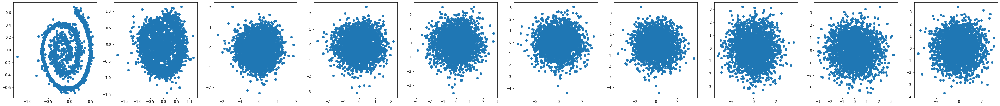

Epoch 26400 | step 000 Loss: 0.37147220969200134 


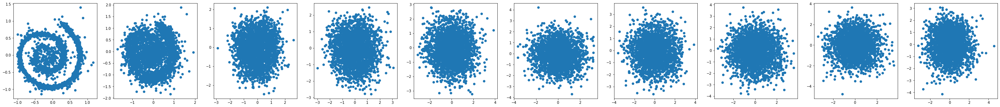

Epoch 26700 | step 000 Loss: 0.36150288581848145 


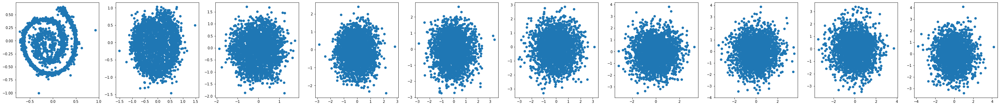

Epoch 27000 | step 000 Loss: 0.3823970556259155 


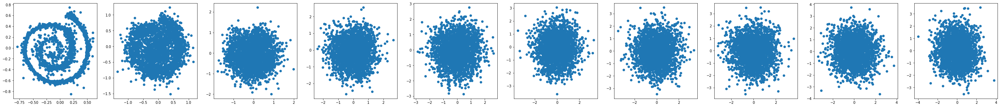

Epoch 27300 | step 000 Loss: 0.337391197681427 


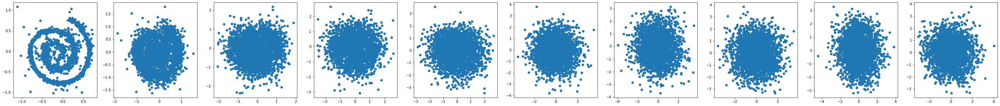

Epoch 27600 | step 000 Loss: 0.36180737614631653 


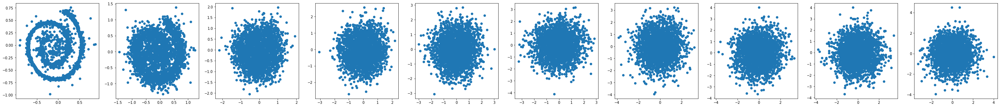

Epoch 27900 | step 000 Loss: 0.3755500912666321 


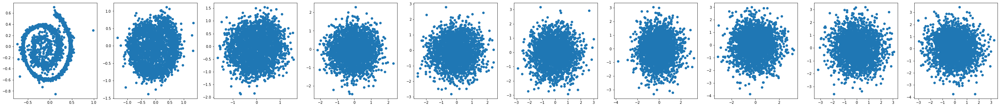

Epoch 28200 | step 000 Loss: 0.3437538743019104 


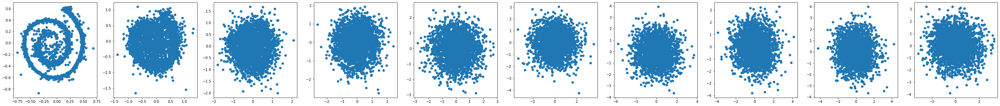

Epoch 28500 | step 000 Loss: 0.38774412870407104 


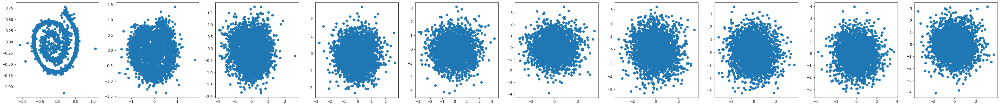

Epoch 28800 | step 000 Loss: 0.37926217913627625 


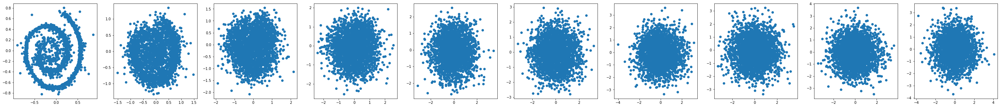

Epoch 29100 | step 000 Loss: 0.35837459564208984 


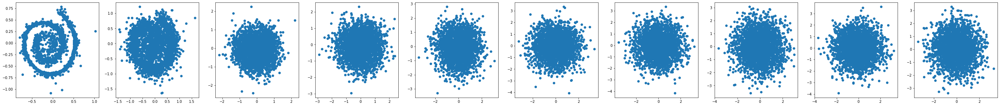

Epoch 29400 | step 000 Loss: 0.3627226948738098 


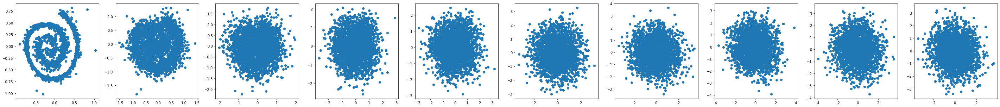

Epoch 29700 | step 000 Loss: 0.3749144673347473 


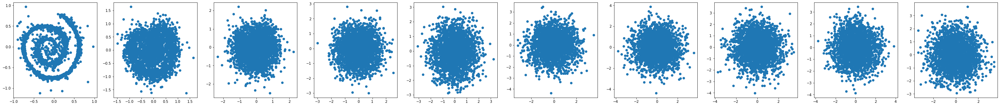

In [29]:
from torch.optim import Adam

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 30000

for epoch in range(epochs):
    for step, batch in enumerate(dataloader):
      optimizer.zero_grad()

      t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
      loss = get_loss(model, batch, t)
      loss.backward()
      optimizer.step()

      if epoch % 300 == 0 and step == 0:
        print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
        sample_plot_image()

In [32]:
# torch.save(model.state_dict(), '/content/drive/MyDrive/VectorUNET.pt')

In [35]:
#@title 测试模型
@torch.no_grad()
def sample_plot_image_v2():
    data = torch.randn([20*128, 1, 2], device=device)
    plt.figure(figsize=(50,5))
    plt.axis('off')
    num_images = 10
    LAST_TIMES = 100
    stepsize = int(LAST_TIMES/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        data = sample_timestep(data, t)
        if i < 100:
          if i % stepsize == 0:
              plt.subplot(1, int(num_images), int(i/stepsize+1))
              plt.scatter(data[:,0, 0].detach().cpu(), data[:, 0, 1].detach().cpu(), cmap='hot')
    plt.show()            

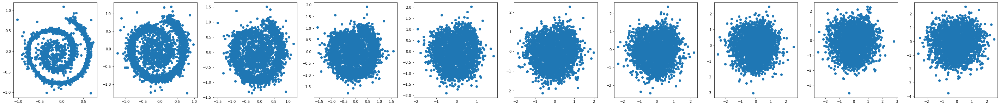

In [36]:
sample_plot_image_v2()